# ISIC 2019 Challenge Data

*by Ben Lewis*

In [1]:
from sklearn.metrics import balanced_accuracy_score

In [6]:
from fastai.vision import *

In [8]:
ls ~/tutorials/data

export.pkl    IMG_3840.jpg
IMG_3831.jpg  ISIC_2019_Training_GroundTruth.csv
IMG_3832.jpg  ISIC_2019_Training_Input/
IMG_3833.jpg  ISIC_2019_Training_Metadata.csv
IMG_3838.jpg  labels.csv
IMG_3839.jpg  models/


In [9]:
path = Path('/home/jupyter/tutorials/data/')
#dest = path/folder
#dest.mkdir(parents=True, exist_ok=True)

In [10]:
pd.read_csv(path/'labels.csv', header=None).head()


,0,1
0,ISIC_0000000,NV
1,ISIC_0000001,NV
2,ISIC_0000002,MEL
3,ISIC_0000003,NV
4,ISIC_0000004,MEL


In [57]:
ls  -U /home/jupyter/tutorials/data/ISIC_2019_Training_Input/ | head -4


ATTRIBUTION.txt
ISIC_0000000.jpg
ISIC_0000001.jpg
ISIC_0000002.jpg
ls: write error: Broken pipe


## View data

In [11]:
# If you already cleaned your data, run this cell instead of the one before
np.random.seed(42)
data = ImageDataBunch.from_csv(path,
                               folder="ISIC_2019_Training_Input", 
                               valid_pct=0.2,
                               #csv_labels='labels.csv',
                               suffix='.jpg',
                               header=None,

                               ds_tfms=get_transforms(),
                               size=224,
                               
                               
                               num_workers=4).normalize(imagenet_stats)

Good! Let's take a look at some of our pictures then.

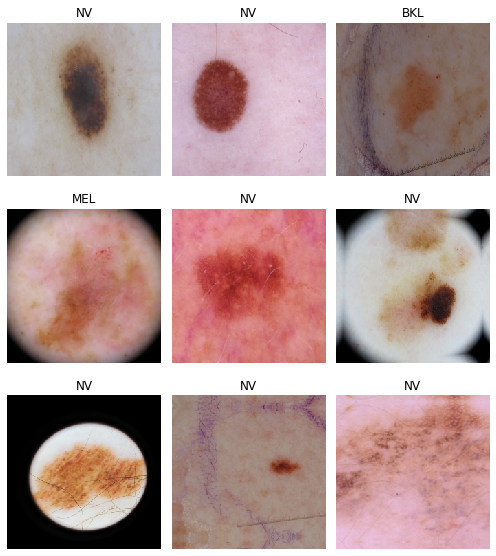

In [12]:
data.show_batch(rows=3, figsize=(7,8))

In [9]:
data.classes, data.c, len(data.train_ds), len(data.valid_ds)

(['AK', 'BCC', 'BKL', 'DF', 'MEL', 'NV', 'SCC', 'VASC'], 8, 20265, 5066)

## Train model

In [13]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

In [11]:
learn.fit_one_cycle(4)
#didn't normalize!
#epoch	train_loss	valid_loss	error_rate	time
#0	1.106194	0.946715	0.333794	04:55
#1	0.897972	0.842689	0.309712	04:54
#2	0.832215	0.779686	0.282669	04:54
#3	0.797499	0.756323	0.273194	04:54

epoch,train_loss,valid_loss,error_rate,time
0,1.123383,0.937651,0.334978,07:30
1,0.922366,0.820594,0.304382,04:37
2,0.821049,0.770847,0.282866,04:38
3,0.798937,0.755092,0.274970,04:37


In [12]:
#learn.save('stage-1')
learn.save('stage-1-normalize')

In [17]:
learn.unfreeze()

In [18]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


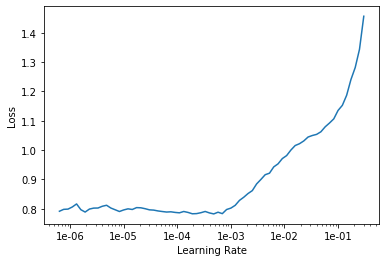

In [19]:
learn.recorder.plot()

In [21]:
learn.fit_one_cycle(2, max_lr=slice(3e-5,3e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.777278,0.685944,0.249507,05:00
1,0.597952,0.587897,0.217726,05:02


In [22]:
#learn.save('stage-2')
learn.save('stage-2-normalize')

## Interpretation

In [56]:
learn.load('stage-1-normalize');

In [15]:
interp = ClassificationInterpretation.from_learner(learn)

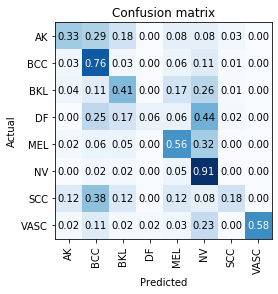

In [25]:
interp.plot_confusion_matrix(normalize = True)

In [54]:
def balanced_multiclass_accuracy(array):
    class_acc = np.zeros(array.shape[0])
    for i in range(array.shape[0]):
        class_acc[i] =  array[i][i] / sum(array[i])
    return sum(class_acc) / array.shape[0]
    

In [53]:
np.zeros(interp.confusion_matrix().shape[0])

array([0., 0., 0., 0., 0., 0., 0., 0.])

In [55]:
balanced_multiclass_accuracy(interp.confusion_matrix())

0.4736231194682581

## Putting your model in production

First thing first, let's export the content of our `Learner` object for production:

In [26]:
learn.export()

This will create a file named 'export.pkl' in the directory where we were working that contains everything we need to deploy our model (the model, the weights but also some metadata like the classes or the transforms/normalization used).

You probably want to use CPU for inference, except at massive scale (and you almost certainly don't need to train in real-time). If you don't have a GPU that happens automatically. You can test your model on CPU like so:

In [27]:
defaults.device = torch.device('cpu')

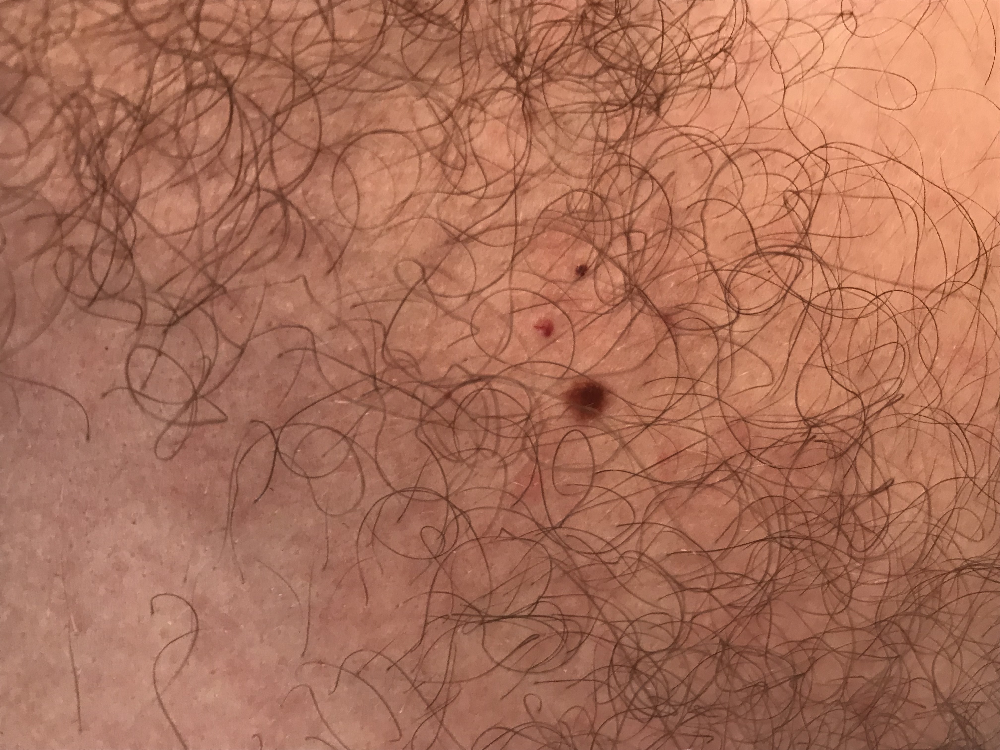

In [40]:
img = open_image(path/'IMG_3839.jpg')
img

We create our `Learner` in production enviromnent like this, jsut make sure that `path` contains the file 'export.pkl' from before.

In [29]:
learn = load_learner(path)

In [41]:
pred_class,pred_idx,outputs = learn.predict(img)
pred_class

Category NV